In [1]:
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import time
import matplotlib.pyplot as plt

from torchvision import datasets, transforms

use_cuda = False
device = torch.device('cuda' if use_cuda else 'cpu')
batch_size = 64

# np.random.seed(42)
# torch.manual_seed(42)

## Dataloaders
train_dataset = datasets.MNIST('mnist_data/', train=True, download=True, transform=transforms.Compose(
    [transforms.ToTensor()]
))
test_dataset = datasets.MNIST('mnist_data/', train=False, download=True, transform=transforms.Compose(
    [transforms.ToTensor()]
))

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(28 * 28, 50)
        self.fc2 = nn.Linear(50, 50)
        self.fc3 = nn.Linear(50, 10)
    
    def forward(self, x):
        # x = (x - 0.1307) / 0.3081
        x = x.view((-1, 28*28))
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# class Normalize(nn.Module):
#     def forward(self, x):
#         return (x - 0.1307) / 0.3081

# model = nn.Sequential(Normalize(), Net())
model = Net()

model = model.to(device)
model.train()

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [2]:
def fgsm(model, x, y, eps):
    model.eval()
    x = x.clone().detach().to(device)
    x.requires_grad = True

    output = model(x)
    loss = criterion(output, y)

    model.zero_grad()
    loss.backward()

    gradient = x.grad.data
    sign_gradient = torch.sign(gradient)

    adv = x + eps * sign_gradient
    adv = torch.clamp(adv, 0, 1)

    return adv

def pgd(model, x, y, k, eps, eps_step):
    model.eval()

    tempt = x.clone().detach()
    tempt.requires_grad = True

    for _ in range(k):
        tempt = fgsm(model, tempt, y, eps_step)
        tempt = torch.clamp(tempt, x - eps, x + eps)
        tempt = torch.clamp(tempt, 0, 1)

    return tempt

In [3]:
def train(model, train_loader, optimizer, epochs):
    model.train()
    for epoch in range(epochs):
        total_loss = 0
        for batch_index, (data, target) in enumerate(train_loader):
            data, target = data.to(device), target.to(device)
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        
        # average_loss = total_loss / len(train_loader)

In [4]:
def test(model, test_loader, epsilon, attack_type='fgsm'):
    model.eval()
    correct = 0

    for data, target in test_loader:
        data, target = data.to(device), target.to(device)
        if epsilon > 0:
            if attack_type == 'fgsm':
                data = fgsm(model, data, target, epsilon)
            elif attack_type == 'pgd':
                data = pgd(model, data, target, k=10, eps=epsilon, eps_step=epsilon / 4)

        output = model(data)
        prediction = output.argmax(dim=1)

        correct += (target == prediction).sum().item()
    
    accuracy = 100 * correct / len(test_loader.dataset)
    print(f'Accuracy under {attack_type} attack (epsilon = {epsilon}): {accuracy:.2f}')
    return accuracy

In [5]:
def interval_analysis(model, data, epsilon):
    model.eval()
    lower_bound = data - epsilon
    upper_bound = data + epsilon

    print(model.modules())
    layers = list(model.modules())

    for layer in layers:
        print(layer)
        if isinstance(layer, nn.ReLU):
            # lower = torch.max(0, lower)
            # upper = torch.max(0, upper)
            lower_bound = torch.clamp(lower_bound, min=0)
            upper_bound = torch.clamp(upper_bound, min=0)

        elif isinstance(layer, nn.Linear):
            lower_bound = lower_bound.view(lower_bound.size(0), -1)
            upper_bound = upper_bound.view(upper_bound.size(0), -1)

            print(layer.weight)

            positive = torch.clamp(layer.weight, min=0)
            negative = torch.clamp(layer.weight, max=0)

            # print('positive : ', positive)
            # print('negative : ', negative)

            lower = torch.matmul(lower_bound, positive.T) + torch.matmul(upper_bound, negative.T)
            upper = torch.matmul(upper_bound, positive.T) + torch.matmul(lower_bound, negative.T)

            lower_bound = lower + layer.bias
            upper_bound = upper + layer.bias

    return lower_bound, upper_bound


def compute_robustness(model, test_loader, epsilon):
    model.eval()
    total = 0
    robust = 0

    for data, target in test_loader:
        data, target = data.to(device), target.to(device)
        
        lower_bound, upper_bound = interval_analysis(model, data, epsilon)
        
        true_low = torch.tensor([lower_bound[i, target[i]] for i in range(len(target))])
        # print('true_low : ', true_low)
        
        mask = torch.ones_like(upper_bound, dtype=torch.bool)
        for i in range(len(target)):
            mask[i, target[i]] = False
        
        others_up = []

        for i in range(len(upper_bound)):
            other_class_bounds = upper_bound[i].clone()
            other_class_bounds[target[i]] = float('-inf')
            max_bound = torch.max(other_class_bounds)
            others_up.append(max_bound)
        
        others_up = torch.tensor(others_up)
        # print('others_up : ', others_up)
        
        is_robust = true_low > others_up
        
        robust += is_robust.sum().item()
        total += len(target)
        
        print('is_robust :', is_robust)
    
    result = robust / total
    print(f'robust (epsilon = {epsilon}): {result}')
    
    return result

Accuracy under fgsm attack (epsilon = 0.01): 92.02
Accuracy under fgsm attack (epsilon = 0.02): 79.78
Accuracy under fgsm attack (epsilon = 0.03): 60.08
Accuracy under fgsm attack (epsilon = 0.04): 42.88
Accuracy under fgsm attack (epsilon = 0.05): 30.88
Accuracy under fgsm attack (epsilon = 0.06): 22.86
Accuracy under fgsm attack (epsilon = 0.07): 17.74
Accuracy under fgsm attack (epsilon = 0.08): 14.26
Accuracy under fgsm attack (epsilon = 0.09): 11.60
Accuracy under fgsm attack (epsilon = 0.1): 9.41
Accuracy under pgd attack (epsilon = 0.01): 91.78
Accuracy under pgd attack (epsilon = 0.02): 76.61
Accuracy under pgd attack (epsilon = 0.03): 52.01
Accuracy under pgd attack (epsilon = 0.04): 32.55
Accuracy under pgd attack (epsilon = 0.05): 18.68
Accuracy under pgd attack (epsilon = 0.06): 9.89
Accuracy under pgd attack (epsilon = 0.07): 4.65
Accuracy under pgd attack (epsilon = 0.08): 1.83
Accuracy under pgd attack (epsilon = 0.09): 0.78
Accuracy under pgd attack (epsilon = 0.1): 0.3

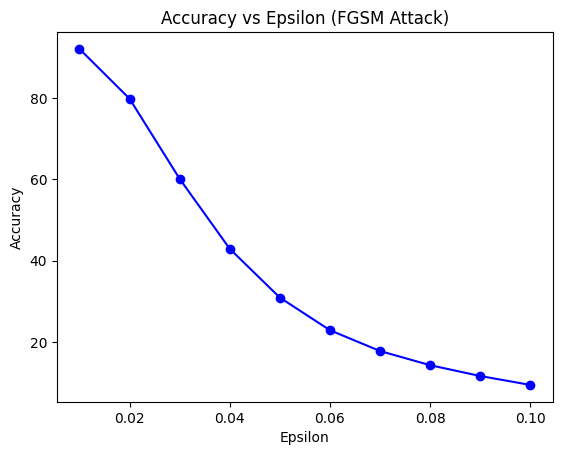

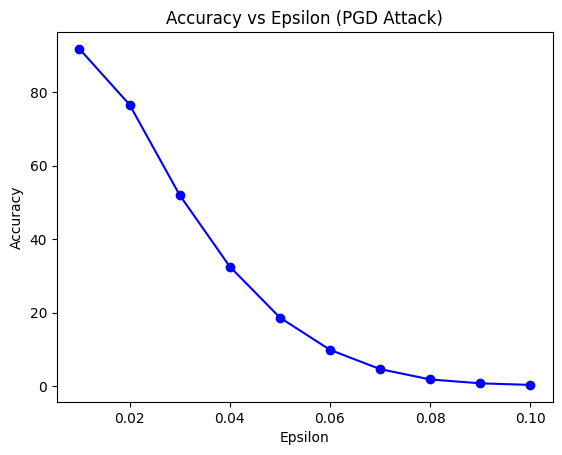

In [6]:
# Training
init = 0
epochs = 20

if init:
    train(model, train_loader, optimizer, epochs)
    torch.save(model.state_dict(), f'weights.pt')
else:
    # model.load_state_dict(torch.load(f'weights.pt'))
    model.load_state_dict(torch.load(f'weights.pt', weights_only=True))

epsilons = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]
attack_types = ['fgsm', 'pgd']

for attack_type in attack_types:
    accuracies = []
    for epsilon in epsilons:
        accuracy = test(model, test_loader, epsilon, attack_type)
        accuracies.append(accuracy)
    
    plt.figure()
    plt.plot(epsilons, accuracies, 'bo-')
    plt.title(f'Accuracy vs Epsilon ({attack_type.upper()} Attack)')
    plt.xlabel('Epsilon')
    plt.ylabel('Accuracy')
    # plt.savefig(f'{attack_type}_attack_results.png')

<generator object Module.modules at 0x0000029B60539D90>
Net(
  (fc1): Linear(in_features=784, out_features=50, bias=True)
  (fc2): Linear(in_features=50, out_features=50, bias=True)
  (fc3): Linear(in_features=50, out_features=10, bias=True)
)
Linear(in_features=784, out_features=50, bias=True)
Parameter containing:
tensor([[ 0.0242, -0.0281, -0.0055,  ..., -0.0343, -0.0019, -0.0042],
        [-0.0326, -0.0238, -0.0187,  ...,  0.0025, -0.0039, -0.0234],
        [ 0.0038,  0.0312,  0.0107,  ..., -0.0019,  0.0098,  0.0156],
        ...,
        [-0.0116,  0.0203, -0.0345,  ...,  0.0258, -0.0002,  0.0162],
        [ 0.0025,  0.0047, -0.0283,  ...,  0.0347,  0.0336, -0.0121],
        [ 0.0062, -0.0164, -0.0219,  ..., -0.0270,  0.0252, -0.0132]],
       requires_grad=True)
Linear(in_features=50, out_features=50, bias=True)
Parameter containing:
tensor([[ 0.0921,  0.0970, -0.0972,  ...,  0.5402, -0.1330, -0.2640],
        [ 0.1280,  0.1062,  0.1084,  ...,  0.0490, -0.0366,  0.0210],
        

Text(0, 0.5, 'Robustness')

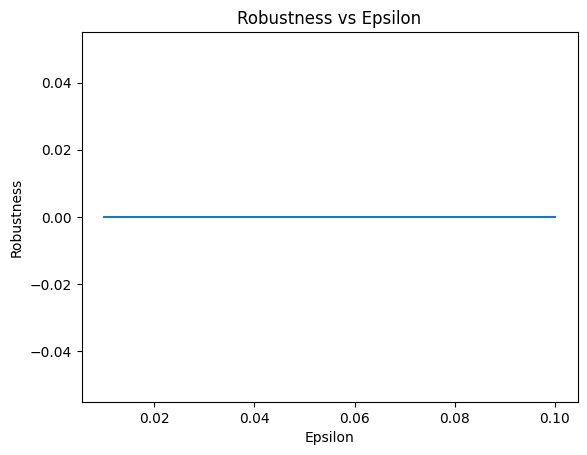

In [7]:
robust_results = []

for epsilon in epsilons:
    robustness = compute_robustness(model, test_loader, epsilon)
    robust_results.append(robustness)

plt.plot(epsilons, robust_results)
plt.title('Robustness vs Epsilon')
plt.xlabel('Epsilon')
plt.ylabel('Robustness')